# SDSS Uncertainty Image+Spectral Cube construction
In this notebook we show the methods in detail how do we construct the uncertainty cube from SDSS Spectra and images. The data used are DR12 images from Stripe 82 and spectra from TBD.

In [1]:
import os
import sys

from hisscube.utils.photometry import Photometry

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from astropy.time import Time
from pathlib import Path
from matplotlib.colors import LogNorm
from importlib import reload
import h5py
import fitsio
from scipy import ndimage
import matplotlib.pyplot as plt
import numpy as np
import timeit
#%matplotlib notebook


photometry = Photometry()

test_image = "../data/raw/images/301/4797/1/frame-g-004797-1-0019.fits.bz2"    
test_spectrum = "../data/raw/spectra/blue_star.fits"

test_images_small = "frame-*-002820-3-0122.fits.bz2"
test_spectra_small = "*.fits"
test_images = "*.fits.bz2"
test_spectra = "*.fits"

img_header, img_data, file = photometry.read_fits_file(test_image)
spec_data, spec_header = photometry.read_spectrum(test_spectrum)
#print(img_header)
t = Time(img_header["DATE-OBS"], format='isot', scale='tai')



# Extracting uncertainty for image measurements.
In this step we extract the uncertainty for an SDSS image and plot all the intermediate by-products below. Steps involved:
1. Reading sky background from the FITS extension.
2. Interpolating the sky background to the image resolution.
3. Reading calibration vector and extending it to whole image (1D calibration vector works because of the way how SDSS continuously reads out the image).
4. Subtracting sky background and image calibration from the calibrated image, thus producing the Image before calibration in Detector Data Numbers.
5. Showing how we can calculate number of electrons from the data numbers - we don't need these for our error calculation.
6. Calculating Errors in the Data Numbers
7. Converting the Data Number errors to Nanomaggies (this is what we store in the uncertainty cube)
8. Showing the error to signal ratio - this plot demonstrates what we would expect - for brighter areas of the image we are more certain about the measurements than for dark areas.

0.018627395998919383
0.019033390999538824
0.019332461000885814
0.18927069900382776


<ipython-input-2-a3ad07cea6ad>:89: RuntimeWarning: divide by zero encountered in true_divide
  err_to_signal = img_err / img


0.234367529003066


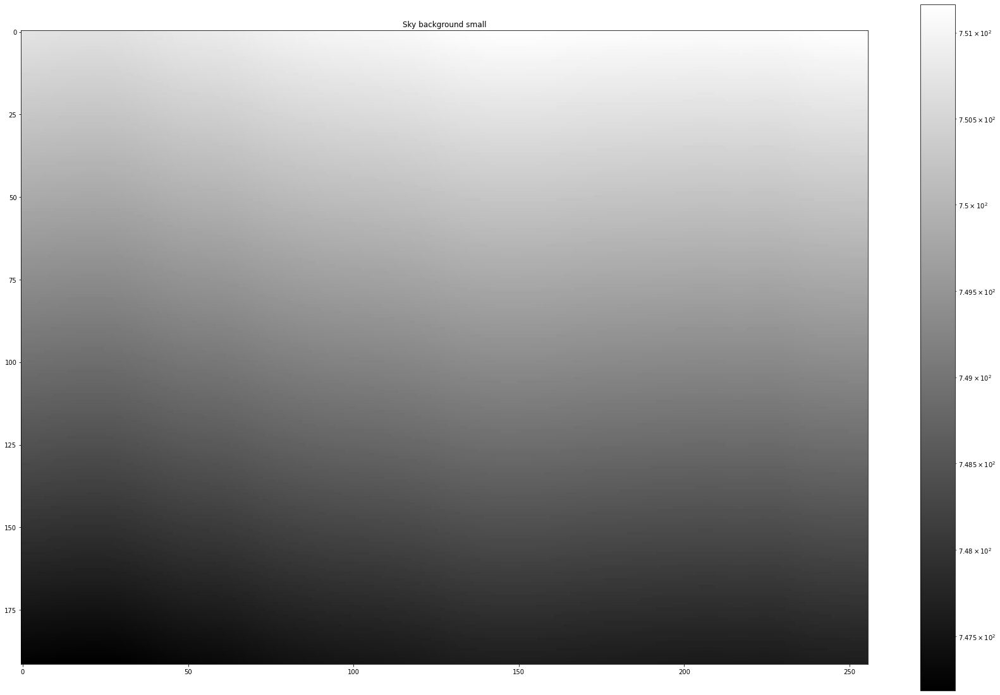

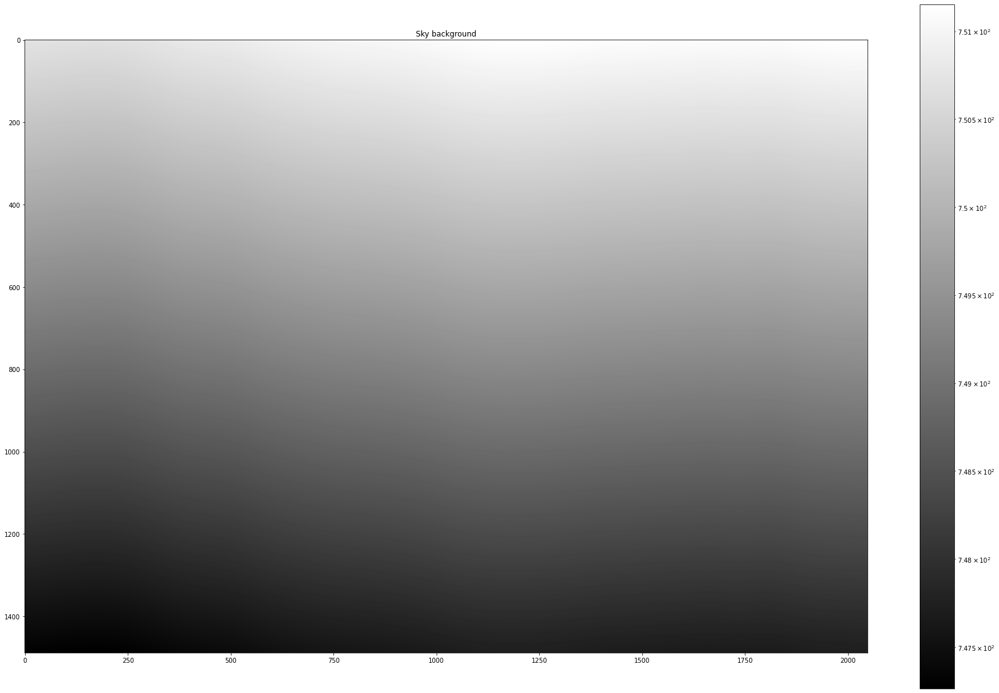

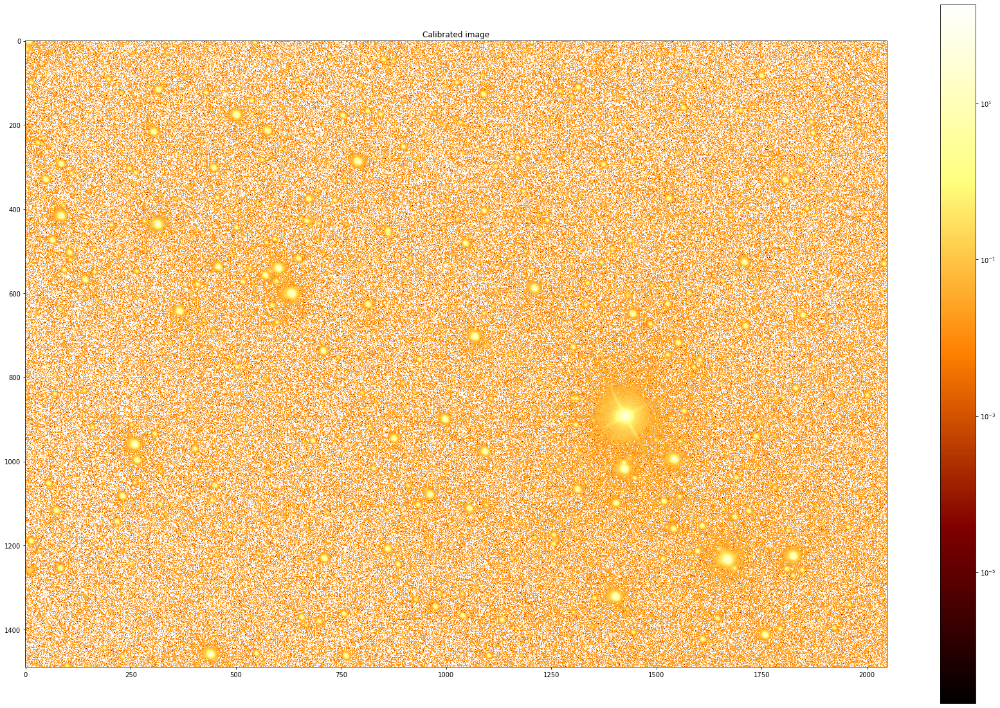

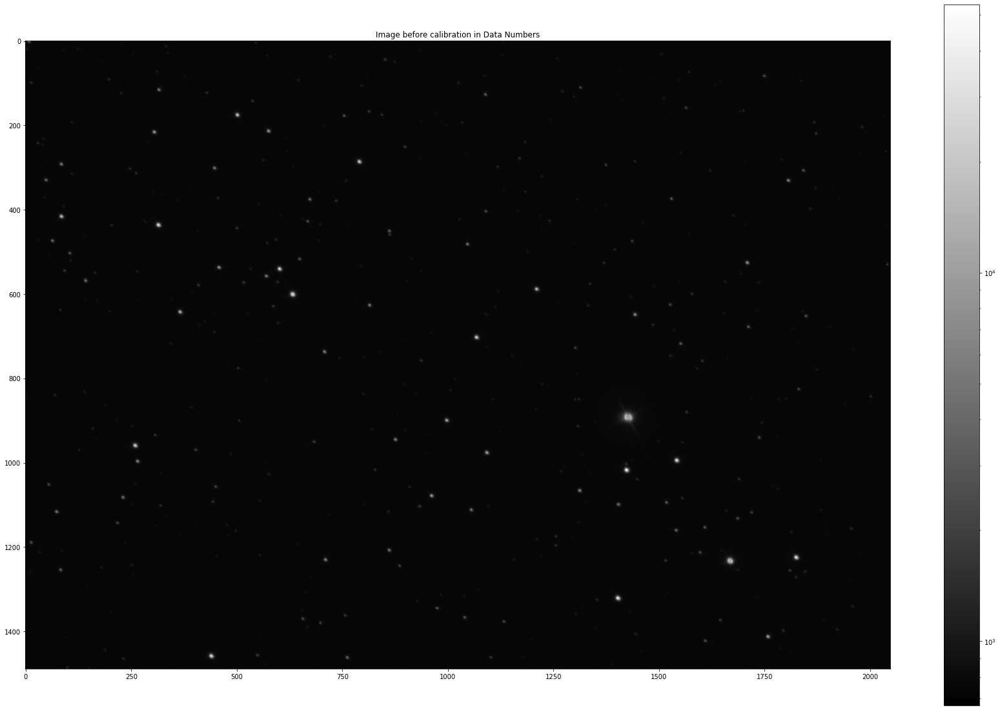

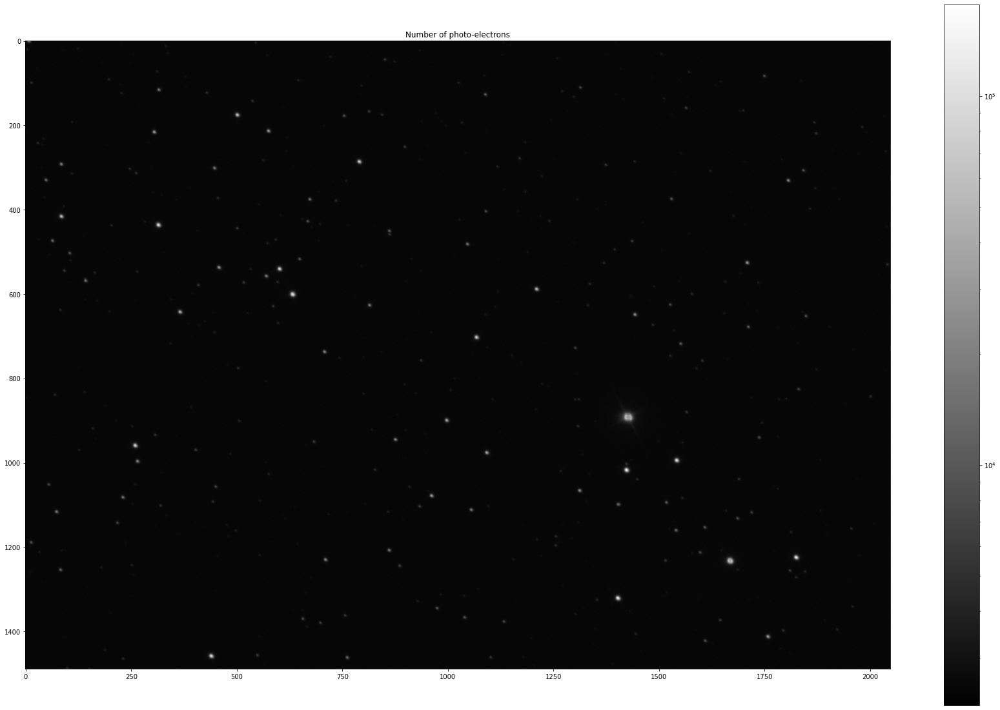

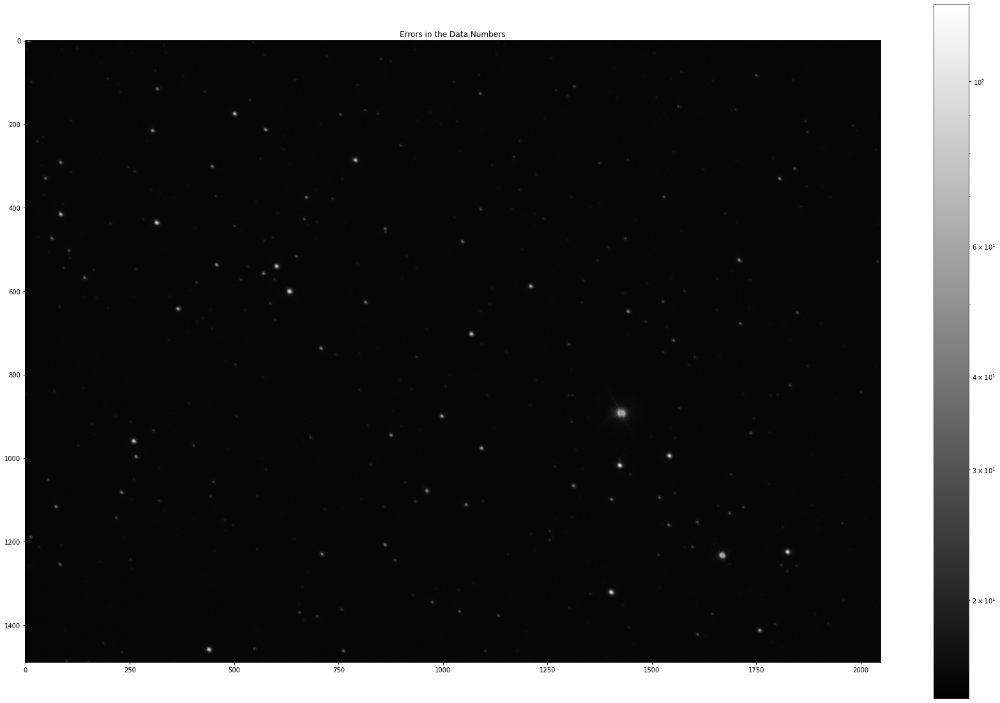

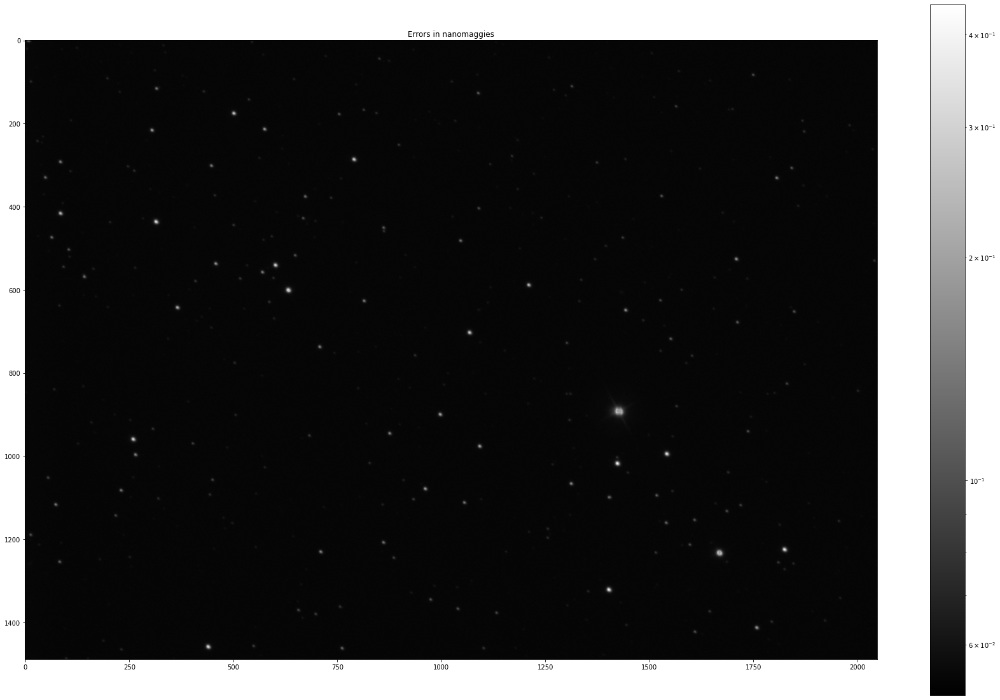

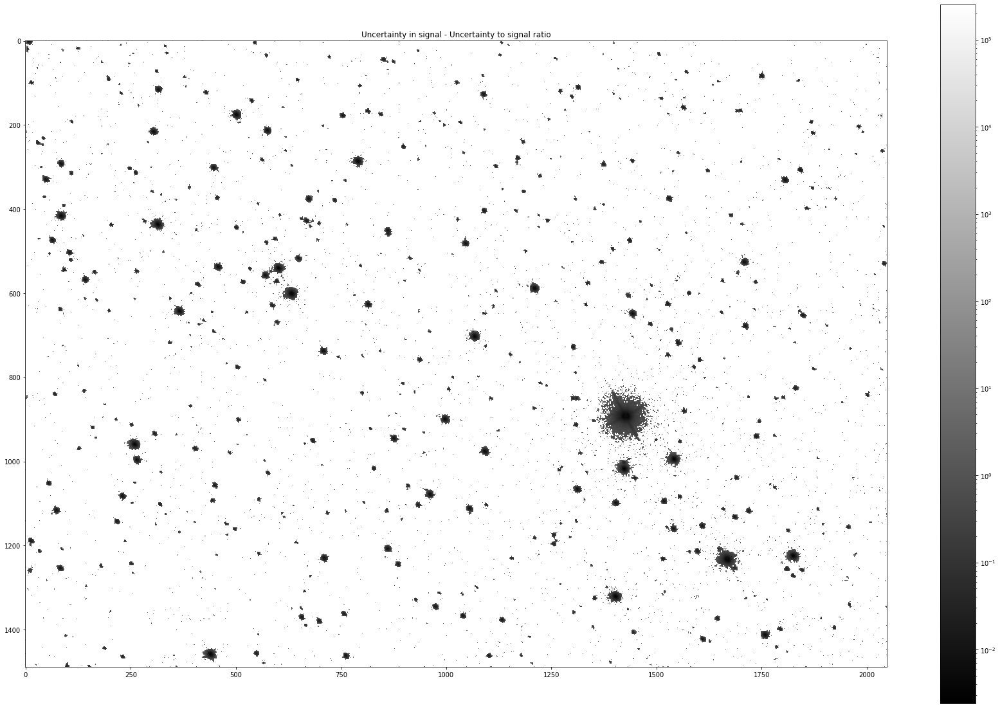

In [2]:


def draw_plots(img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal):
    plt.figure(figsize=(30,20))
    plt.imshow(allsky, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Sky background small")

    plt.figure(figsize=(30,20))
    plt.imshow(simg, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Sky background")

    plt.figure(figsize=(30,20))
    plt.imshow(img, cmap='afmhot', norm=LogNorm())
    plt.colorbar()
    plt.title("Calibrated image")

    plt.figure(figsize=(30,20))
    plt.imshow(dn, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Image before calibration in Data Numbers")

    plt.figure(figsize=(30,20))
    plt.imshow(nelec, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Number of photo-electrons")

    plt.figure(figsize=(30,20))
    plt.imshow(dn_err, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Errors in the Data Numbers")

    plt.figure(figsize=(30,20))
    plt.imshow(img_err, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Errors in nanomaggies")

    plt.figure(figsize=(30,20))
    plt.imshow(err_to_signal, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Uncertainty in signal - Uncertainty to signal ratio")

def get_image_with_errors(fitsPath):
    with fitsio.FITS(fitsPath) as f:
        start_time = timeit.default_timer()
        fits_header = f[0].read_header()
        img = f[0].read()
        x_size = fits_header["NAXIS1"]
        y_size = fits_header["NAXIS2"]
        camcol = fits_header['CAMCOL']
        run = fits_header['run']
        band = fits_header['filter']    
        allsky = f[2]['allsky'].read()[0]
        xinterp = f[2]['xinterp'].read()[0]
        yinterp = f[2]['yinterp'].read()[0]
        
        elapsed1 = timeit.default_timer() - start_time
        
        print(elapsed1)


        gain = float(photometry.get_ccd_gain(camcol, run, band))
        darkVariance = float(photometry.get_dark_variance(camcol, run, band))
        elapsed2 = timeit.default_timer() - start_time
        
        print(elapsed2)
        
        grid_x, grid_y = np.meshgrid(xinterp, yinterp, copy=False)
        elapsed3 = timeit.default_timer() - start_time
        
        print(elapsed3)
        #interpolating sky background from 256x196 small image included in SDSS
        simg = ndimage.map_coordinates(allsky, (grid_y, grid_x), order = 1, mode="nearest")
        
        elapsed4 = timeit.default_timer() - start_time
        print(elapsed4)

        calib = f[1].read()

        cimg = np.tile(calib, (y_size, 1)) #calibration image constructed from calibration vector

        dn = img / cimg + simg #data numbers detected originally by the detector 

        nelec = dn*gain #number of electrons

        dn_err = np.sqrt(dn/gain + darkVariance) #errors in data numbers (sigma)

        img_err= dn_err*cimg  #errors in nanomaggies (sigma)

        err_to_signal = img_err / img
        elapsed5 = timeit.default_timer() - start_time
        print(elapsed5)

        
        return img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal
    
    
img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal = get_image_with_errors(test_image)

draw_plots(img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal)

# Extracting spectrum errors
For the spectrum the SDSS has made life much more easy for us as the inverse variance of the measurement is already stored in the fits files. We just need to convert both to nano-maggies to be able to compare it with image photometry, as it is in '1E-17 erg/cm^2/s/Ang' units.

[3.5804 3.5805 3.5806 ... 3.9643 3.9644 3.9645]


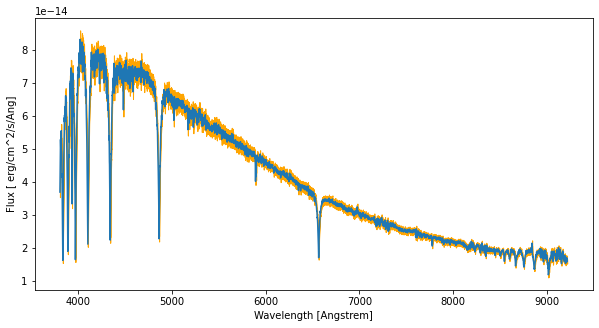

In [3]:
def plot_spec(fits_path):
    with fitsio.FITS(fits_path) as hdul:
        data = hdul[1].read()
        flux = data["flux"] * 1e-17
        sigma =  np.sqrt(np.divide(1,data["ivar"])) * 1e-17
        wl = np.power(10, data["loglam"])
        print(data["loglam"])
        plt.figure(figsize=(10,5))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Flux [ erg/cm^2/s/Ang]")
        ax.plot(wl, flux)
        ax.fill_between(wl, flux - sigma, flux + sigma, color="orange")
        return wl, flux, sigma

spec_wl, spec_flux, spec_sigma = plot_spec(test_spectrum)


# Getting Filter transmission curves
We are not able to compare directly spectroscopic measurements with photometric ones. However, we can approximate this by applying the filter transmission curves to the spectrum and thus simulate values that would be measured to photon counts reduced by filter transmission function.

Below we show how the transmission curve looks like throught the whole spectrograph range. We take the transmission curves for individual filters and take the maximum transmission ratio for each wavelength, which essentially gets rid of the filter overlaps. We can do this because the image coordinates are the mid_points of those filters which are no in the overlapping regions anyway, so there will be no ambiguity to which filter should be applied in those regions.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


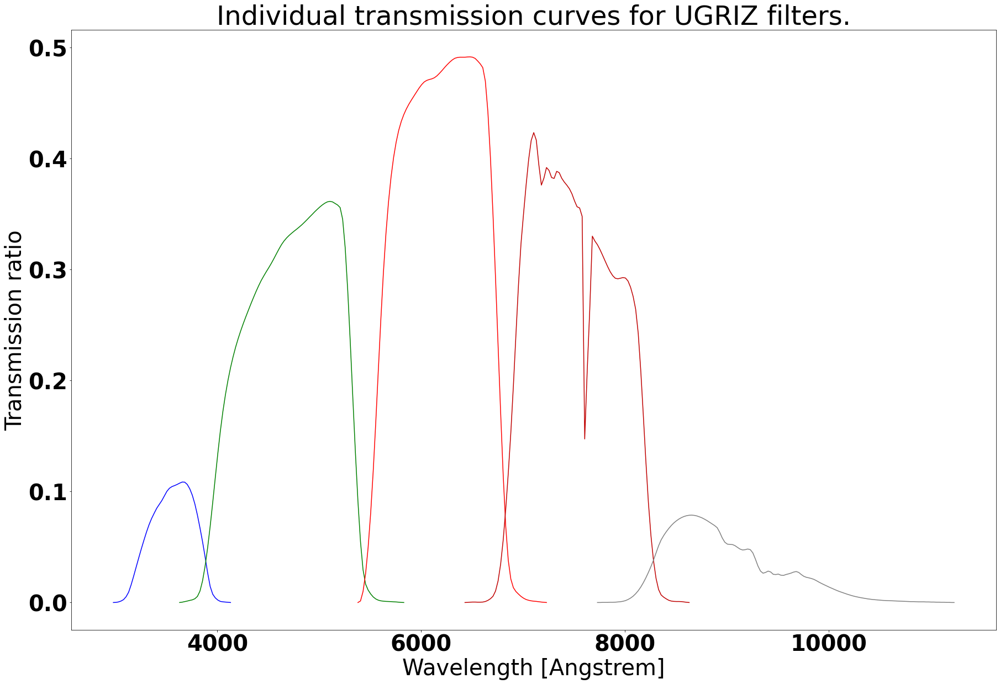

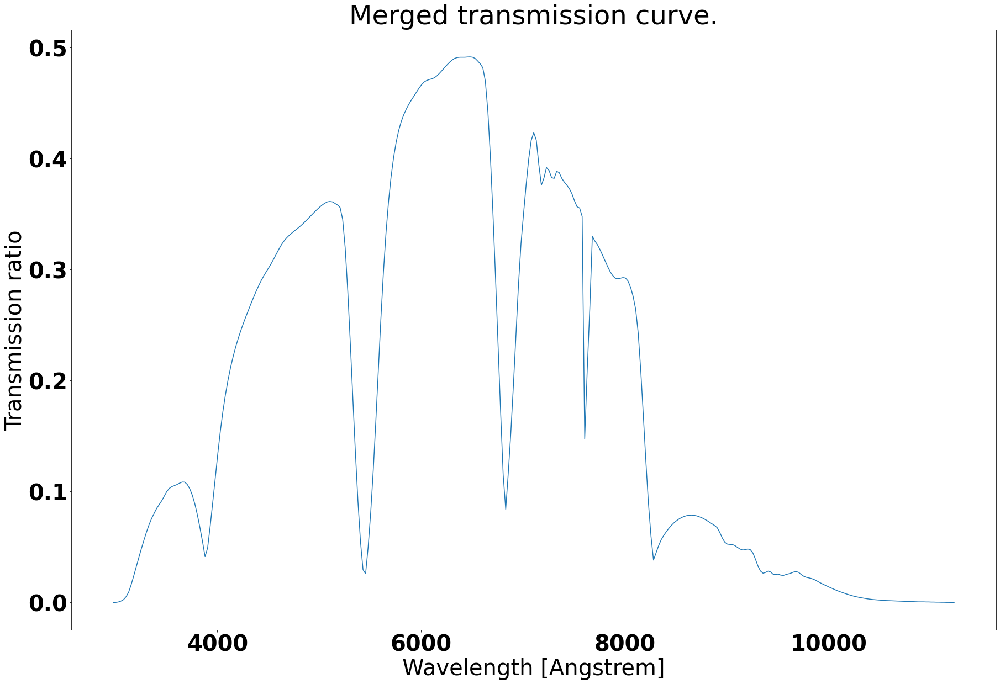

In [4]:
u = photometry.transmission_curves["u"]
g = photometry.transmission_curves["g"]
r = photometry.transmission_curves["r"]
i = photometry.transmission_curves["i"]
z = photometry.transmission_curves["z"]

merged_transmission_curve = photometry.merged_transmission_curve

wl, band_ratio = zip(*list(merged_transmission_curve.items()))
band, ratio = zip(*list(band_ratio))
u_wl, u_ratio = zip(*list(u.items()))
g_wl, g_ratio = zip(*list(g.items()))
r_wl, r_ratio = zip(*list(r.items()))
i_wl, i_ratio = zip(*list(i.items()))
z_wl, z_ratio = zip(*list(z.items()))


font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 40}

plt.rc('font', **font)

plt.figure(figsize=(30,20))
ax_u = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Transmission ratio")
ax_u = ax_u.plot(u_wl, u_ratio, color="blue")
ax_g = plt.plot(g_wl, g_ratio, color="green")
ax_r = plt.plot(r_wl, r_ratio, color="red")
ax_i = plt.plot(i_wl, i_ratio, color="#BF0000")
ax_z = plt.plot(z_wl, z_ratio, color="grey")
plt.title("Individual transmission curves for UGRIZ filters.")

plt.figure(figsize=(30,20))
ax_merged = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Transmission ratio")
ax_merged = plt.plot(wl, ratio)
plt.title("Merged transmission curve.")

print()

# Applied transmission curve
This is how the spectrum looks like when the photometric transmission curve is applied.
Procedure:
1. Multiply magnitude in each wavelength with the transmission curve ratio in that wavelength.

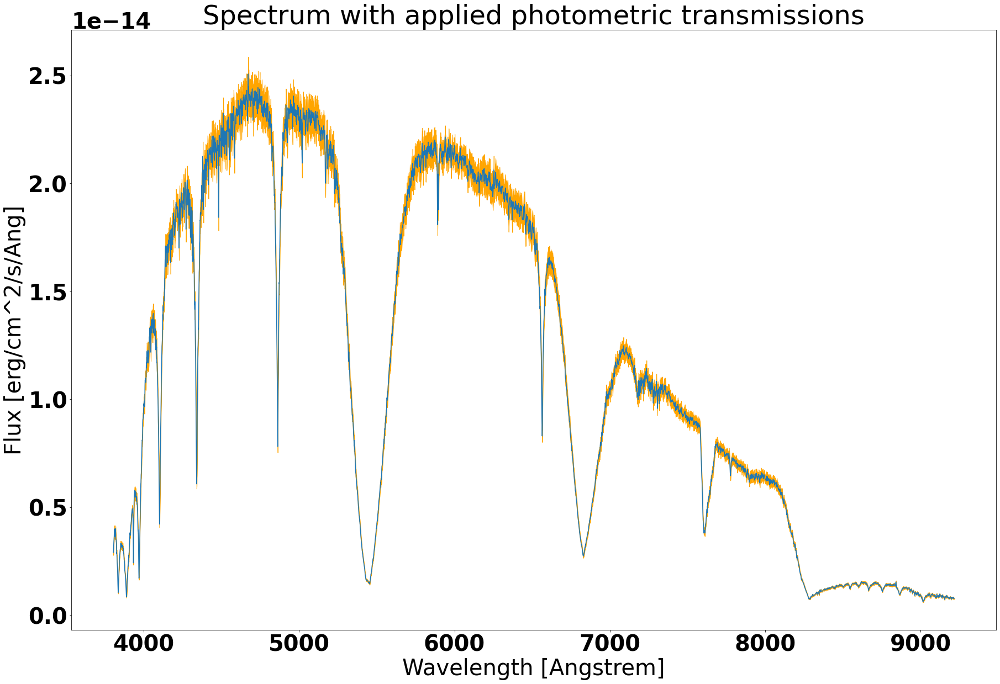

In [5]:
transmission_ratio, zero_point, softening = photometry.get_photometry_params(spec_flux, spec_wl)

photometric_observed_spectrum_flux = spec_flux * transmission_ratio
photometric_observed_spectrum_flux_sigma =  spec_sigma * transmission_ratio# ?? - this is not correct, how shoul we transform variances

plt.figure(figsize=(30,20))
ax1 = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Flux [erg/cm^2/s/Ang]")
ax1.plot(spec_wl, photometric_observed_spectrum_flux)
ax1.fill_between(spec_wl, 
                photometric_observed_spectrum_flux - photometric_observed_spectrum_flux_sigma, 
               photometric_observed_spectrum_flux + photometric_observed_spectrum_flux_sigma, 
              color="orange")
plt.title("Spectrum with applied photometric transmissions")
print()

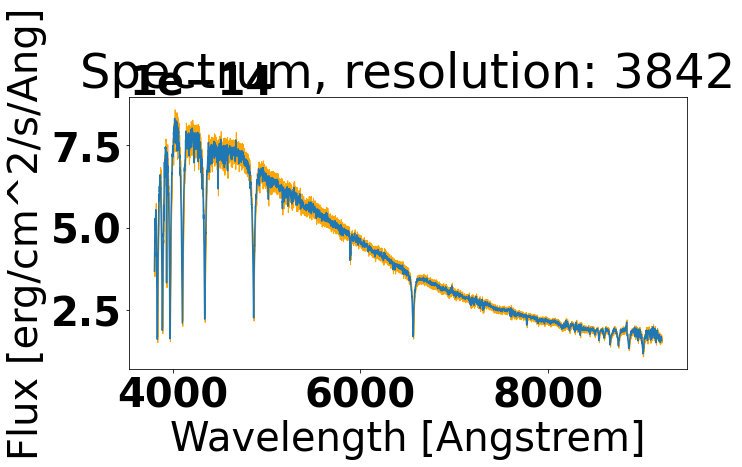

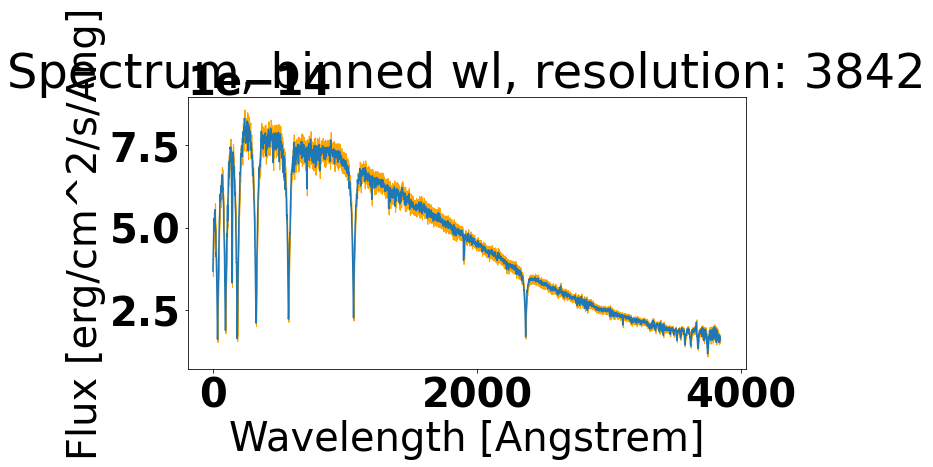

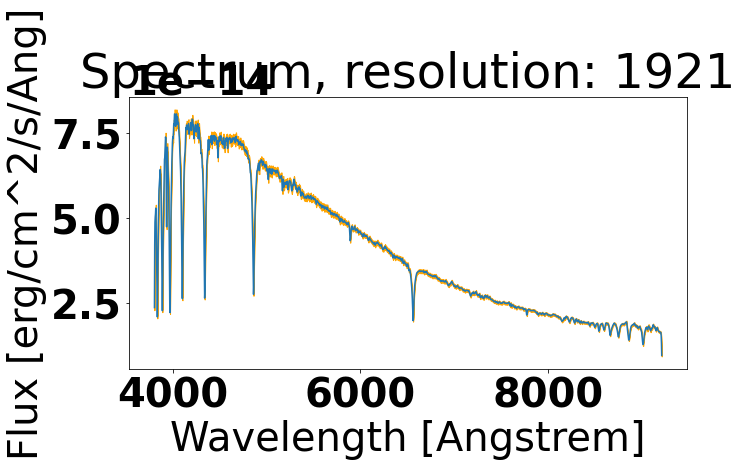

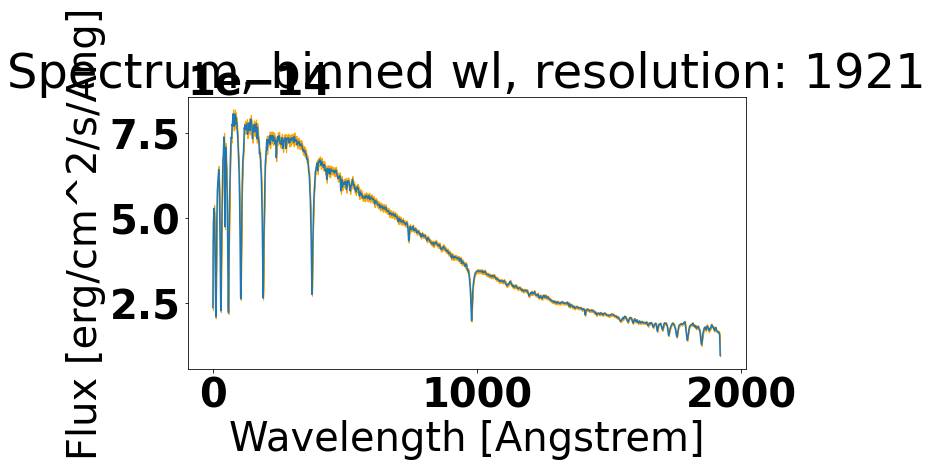

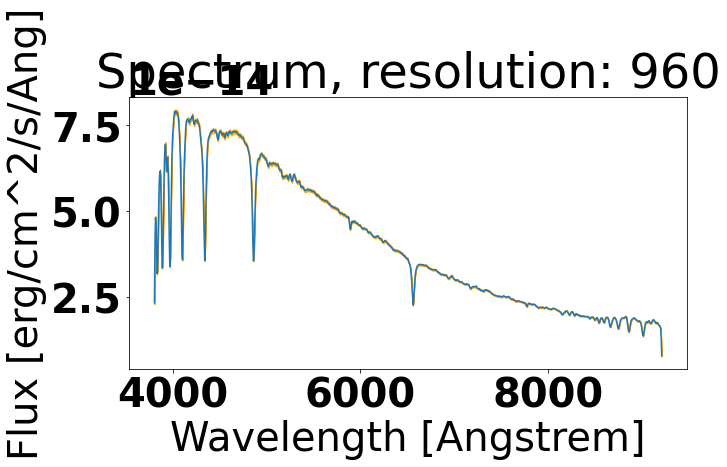

...

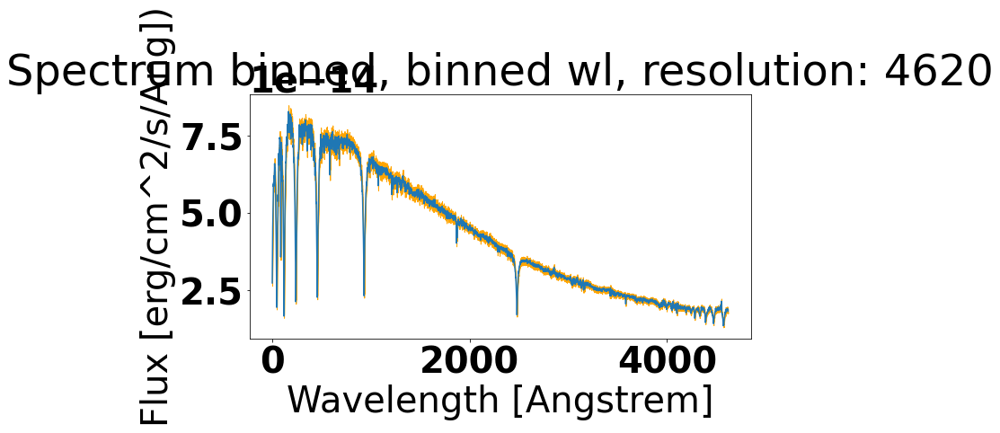

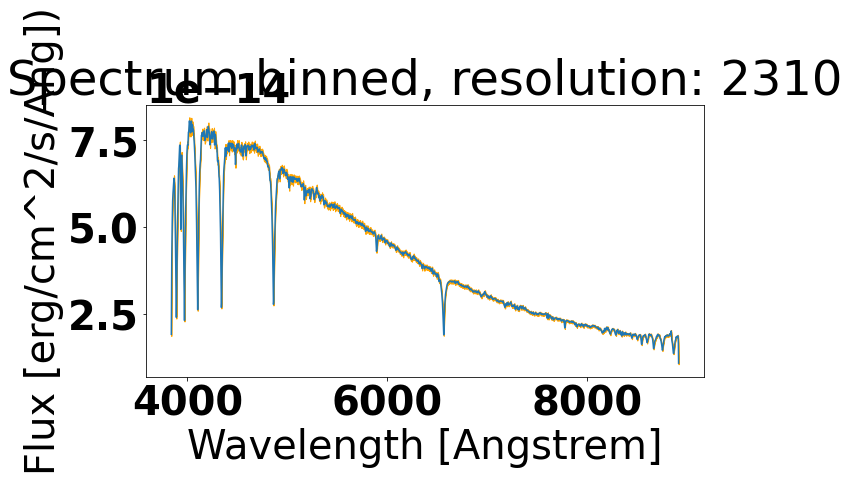

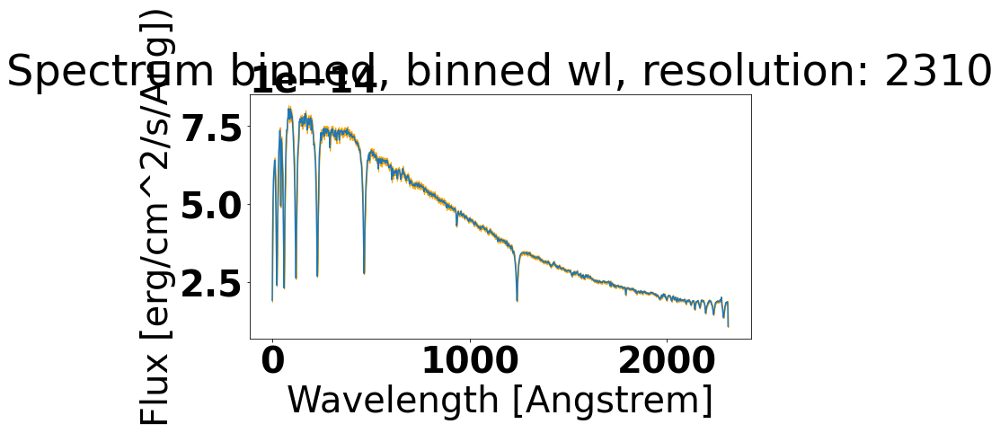

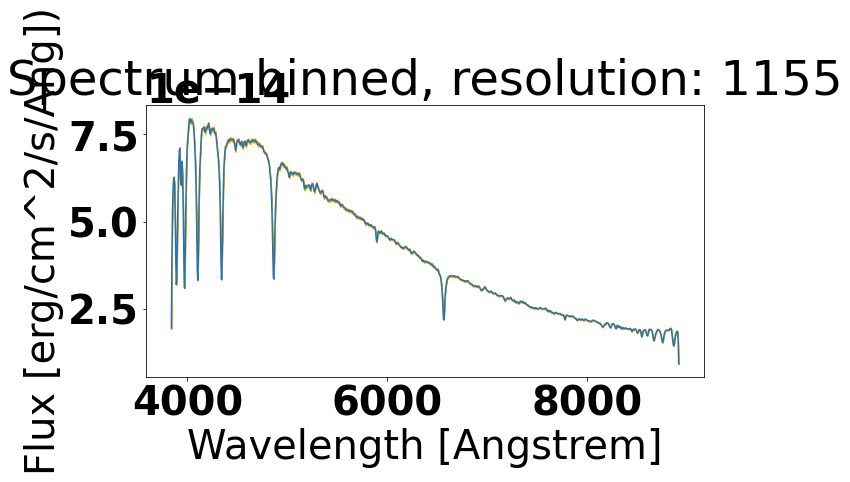

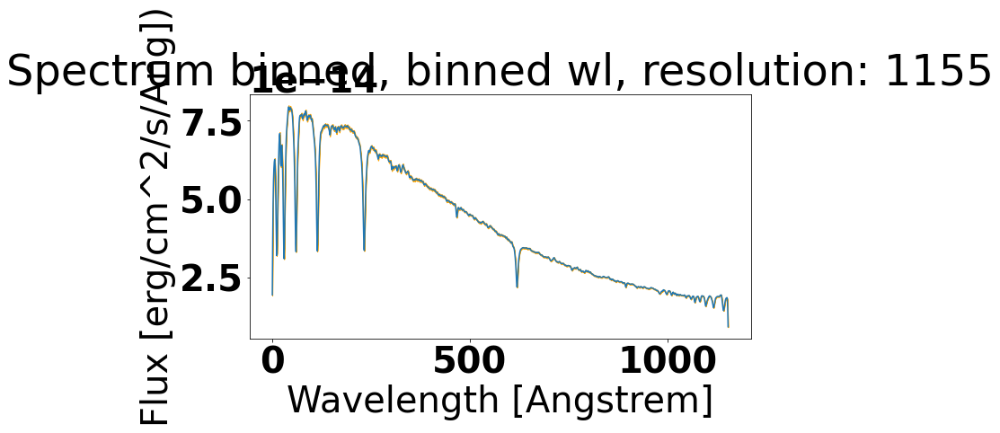

In [6]:
spec_zoom_cnt = 2

def plot_cube(res_cube, trans_txt, y_unit):
    for spec in res_cube:
        wl = spec["wl"]
        flux = spec["flux_mean"]
        flux_sigma = spec["flux_sigma"]
        plt.figure(figsize=(10,5))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel=y_unit)
        ax.plot(wl, flux)
        ax.fill_between(wl, 
                        flux - flux_sigma, 
                        flux + flux_sigma, 
                        color="orange")
        plt.title("%s, resolution: %s" %(trans_txt, spec["zoom"]))
        
        bins = range(0,len(wl))
        
        plt.figure(figsize=(10,5))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel=y_unit)
        ax.plot(bins, flux)
        ax.fill_between(bins, 
                        flux - flux_sigma, 
                        flux + flux_sigma, 
                        color="orange")
        plt.title("%s, binned wl, resolution: %s" %(trans_txt, spec["zoom"]))

fits_header, spec_cube = photometry.get_multiple_resolution_spectrum(test_spectrum, spec_zoom_cnt,
                                                                     apply_rebin=False, rebin_min=0, rebin_max=0,
                                                                     rebin_samples=0, apply_transmission=False)
fits_header, spec_cube_binned = photometry.get_multiple_resolution_spectrum(test_spectrum, spec_zoom_cnt,
                                                                            apply_rebin=True, rebin_min=3839.7244, rebin_max=8914.597,
                                                                            rebin_samples=4620, apply_transmission=False)
plot_cube(spec_cube, "Spectrum", "Flux [erg/cm^2/s/Ang]")
plot_cube(spec_cube_binned, "Spectrum binned", 
          "Flux [erg/cm^2/s/Ang])")

# Constructing multiple resolution spectrum
Here we show how the multiple resolution spectrum is constructed, with the same algorithm as above:
1. In Fluxes without photometric transmission applied
2. In Magnitudes without photometric transmission applied
3. In Magnitudes with photomoetric transmission applied

For each of these, we construct the lower resolutions down to the MIN_RES setting (Each lower resolution is half of the upper one, meaning we get spectral resolutions e.g. (4620, 2310, 1155, etc.)

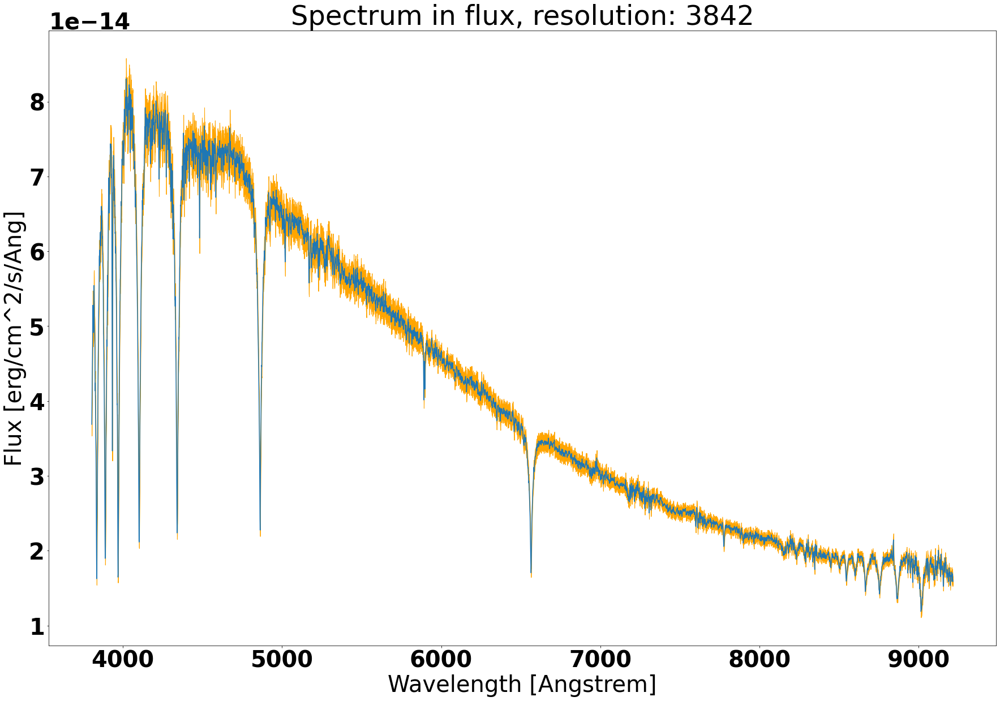

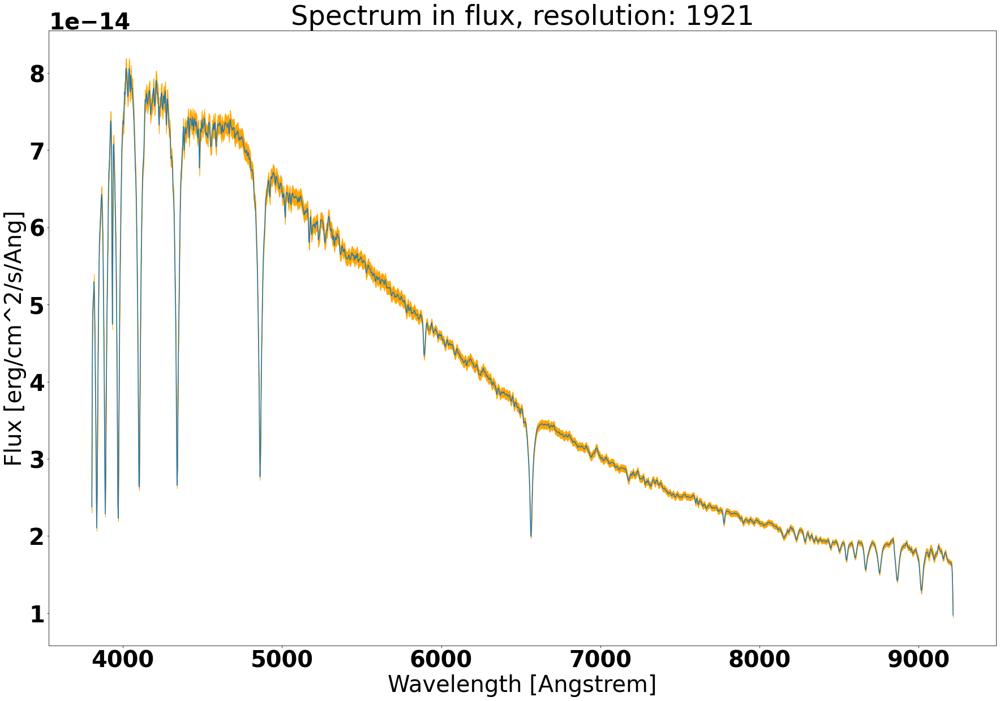

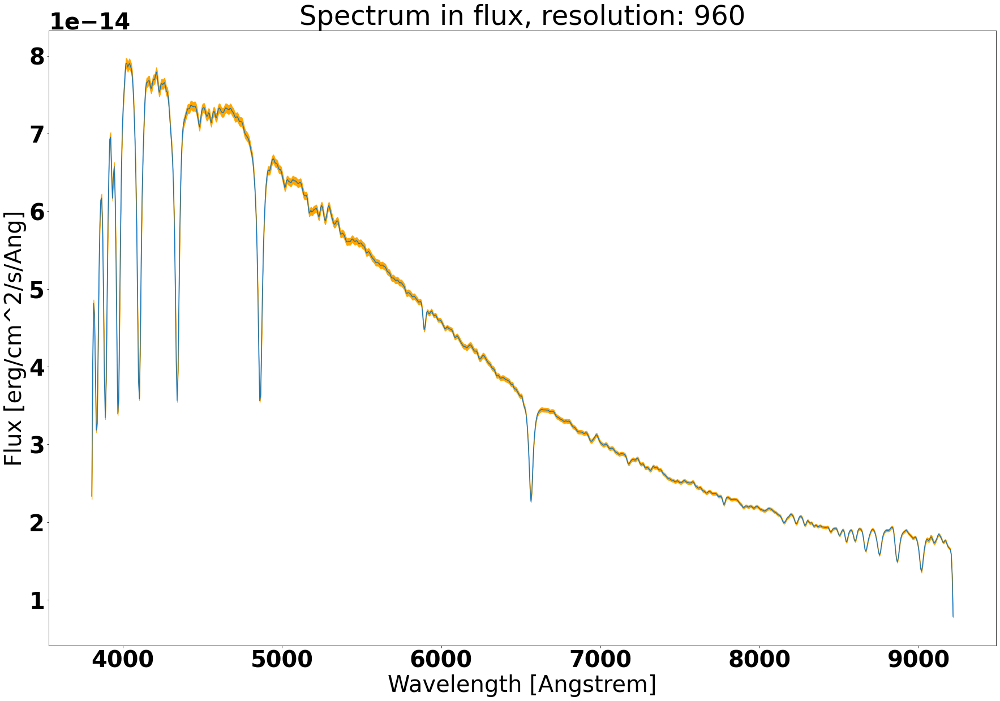

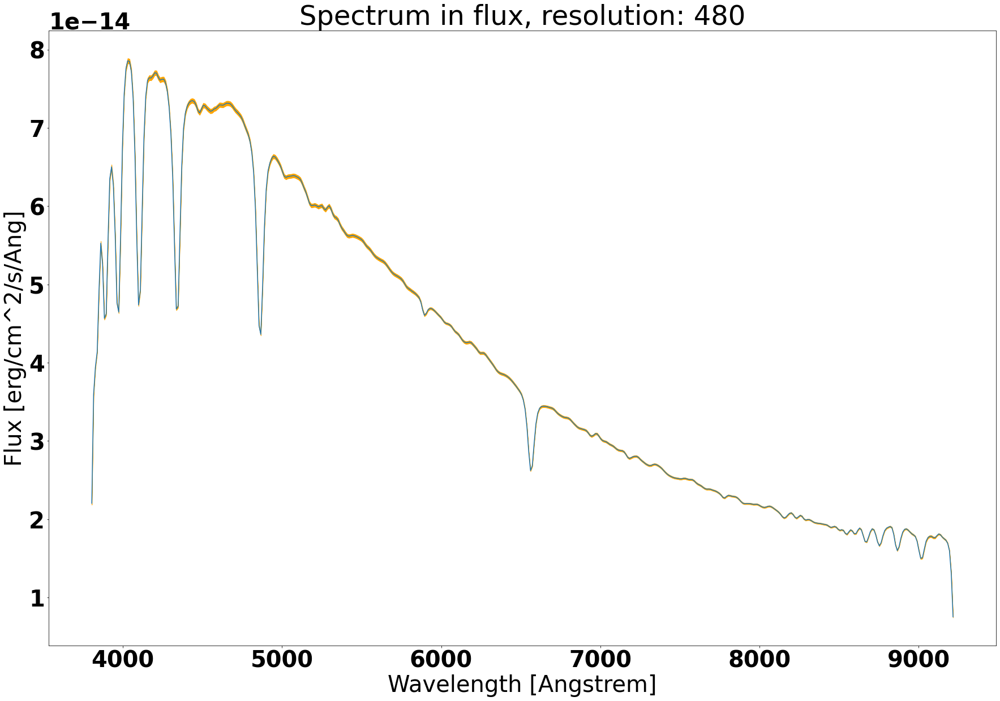

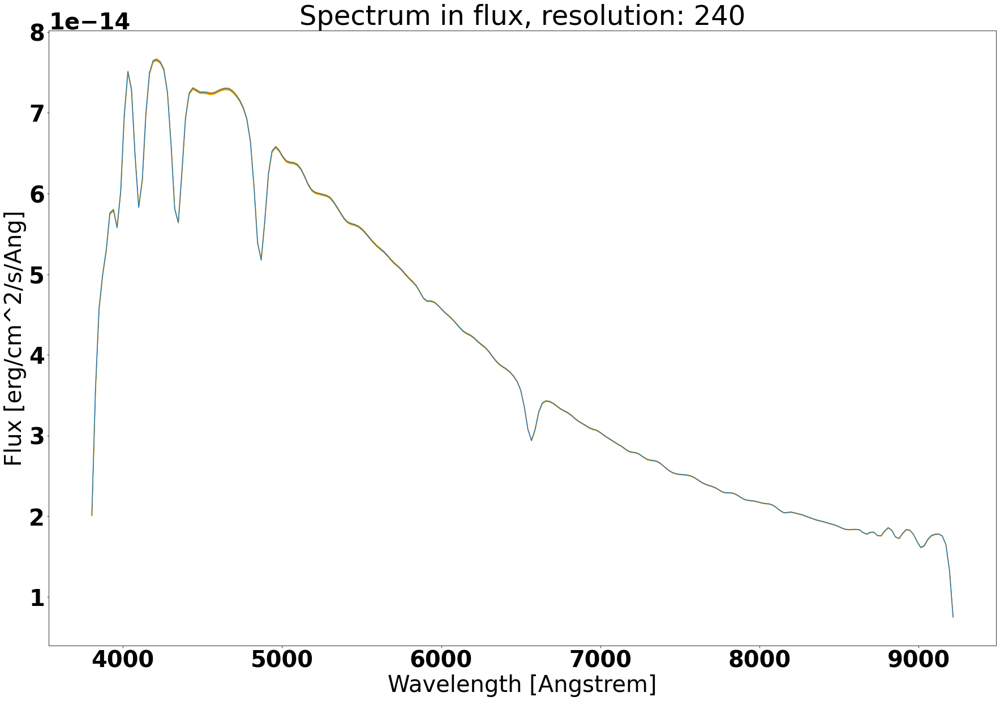

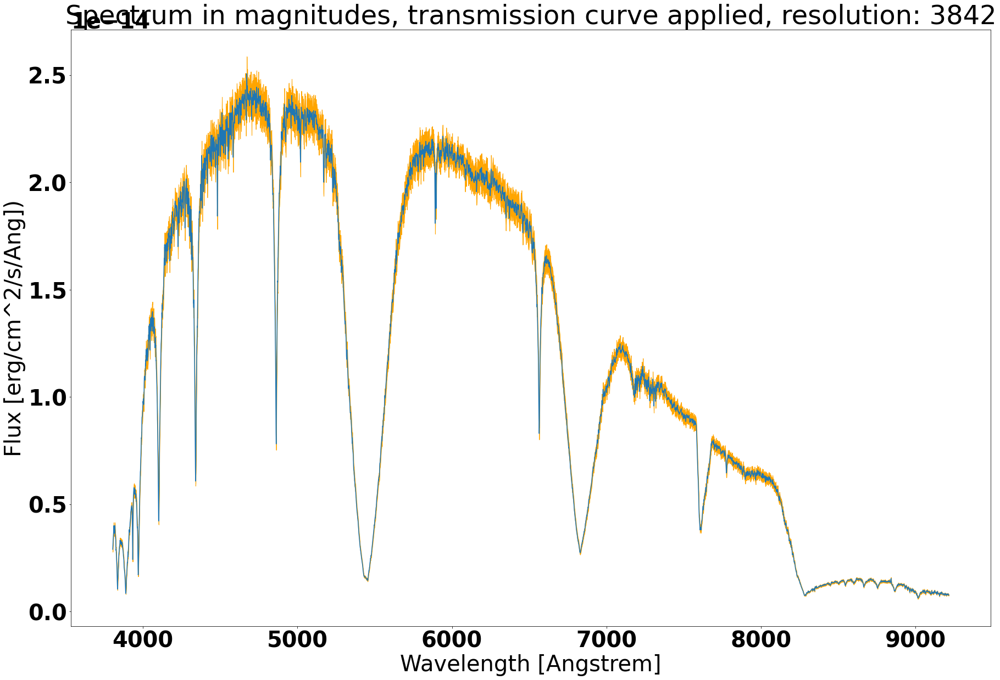

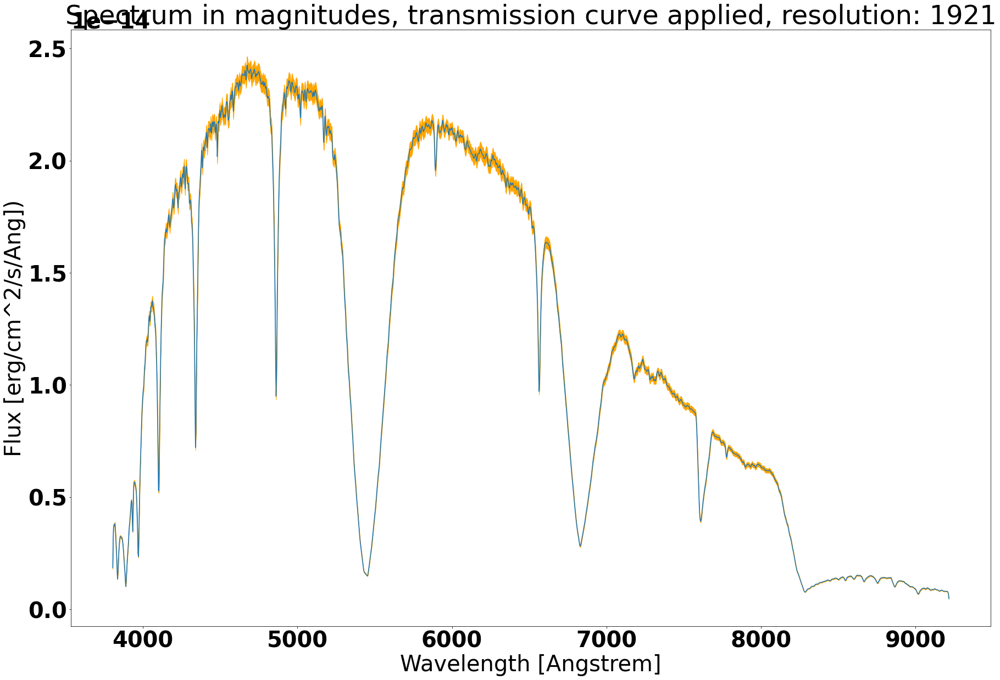

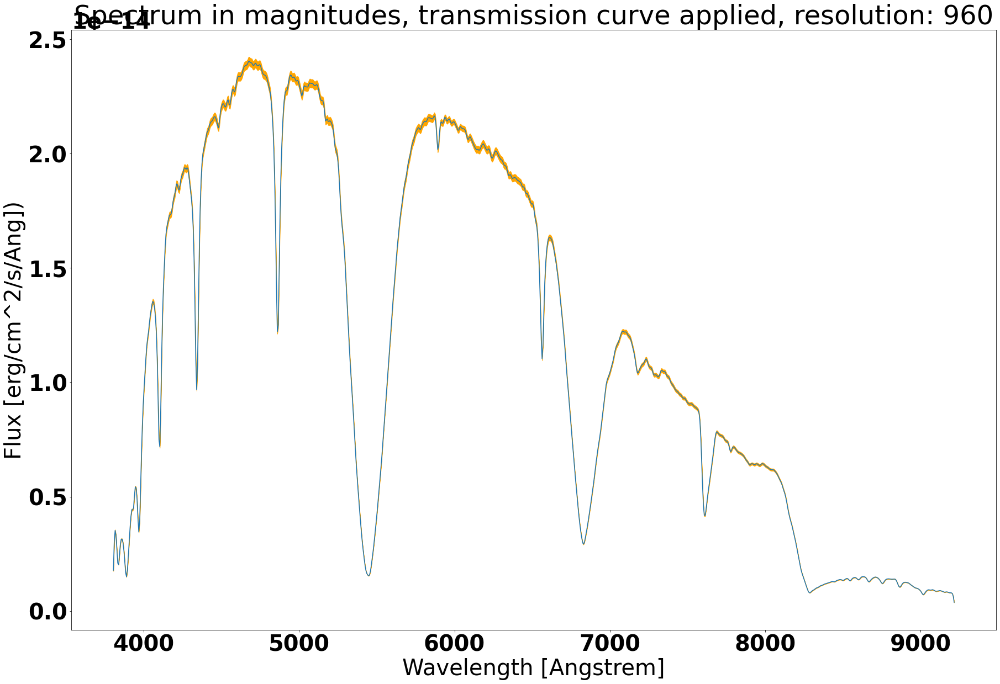

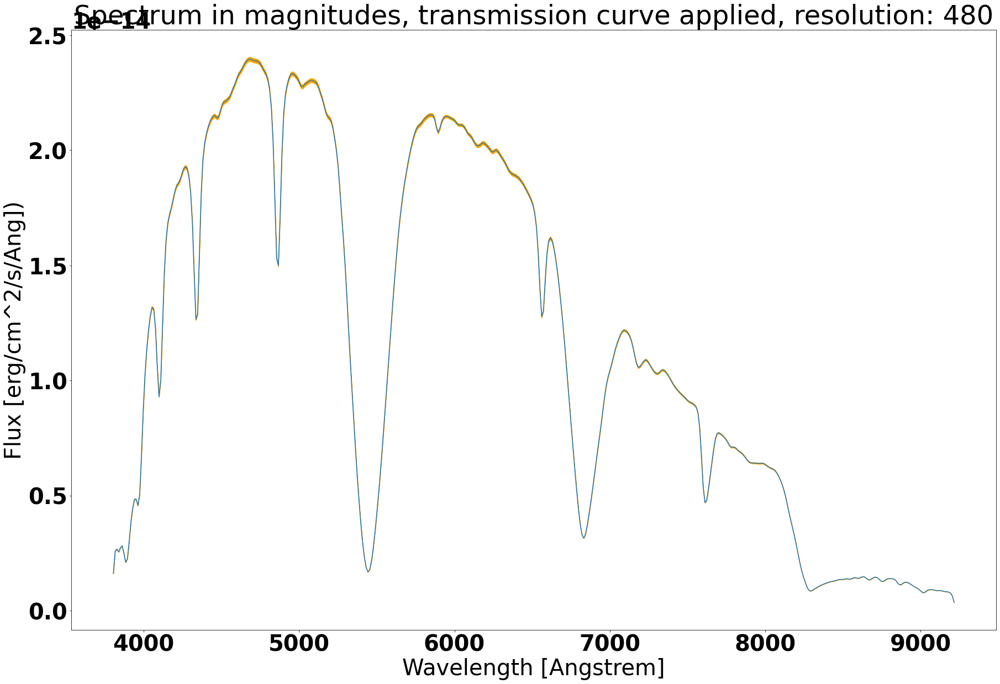

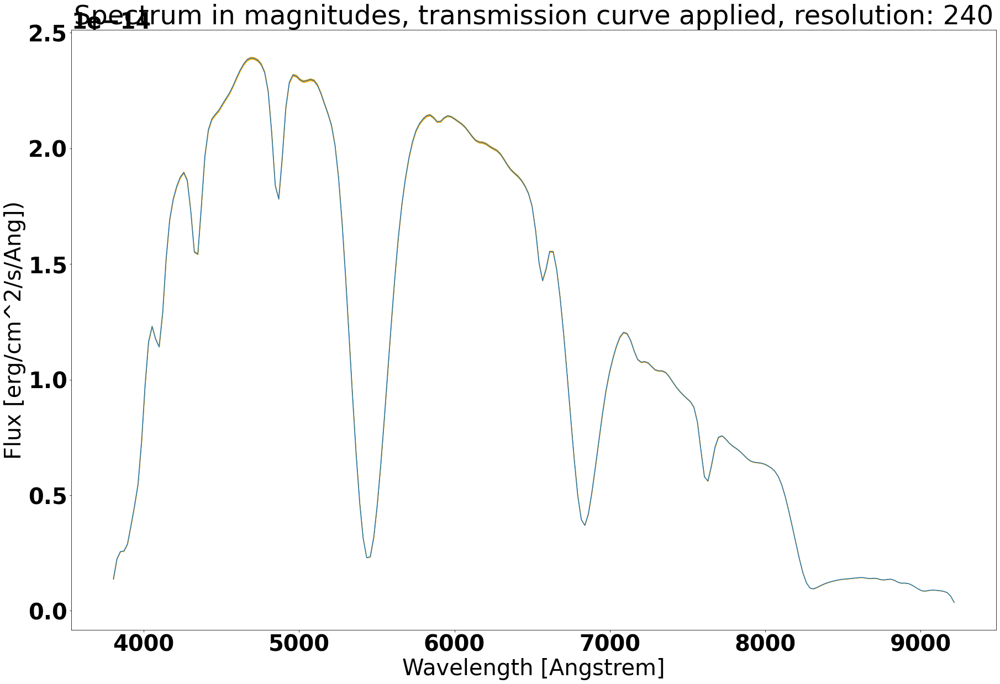

In [7]:
spec_zoom_cnt = 4

def plot_cube(res_cube, trans_txt, y_unit):
    for spec in res_cube:
        wl = spec["wl"]
        flux = spec["flux_mean"]
        flux_sigma = spec["flux_sigma"]
        plt.figure(figsize=(30,20))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel=y_unit)
        ax.plot(wl, flux)
        ax.fill_between(wl, 
                        flux - flux_sigma, 
                        flux + flux_sigma, 
                        color="orange")
        plt.title("%s, resolution: %s" %(trans_txt, spec["zoom"]))

fits_header, spec_cube = photometry.get_multiple_resolution_spectrum(test_spectrum,
                                                                     spec_zoom_cnt,
                                                                     apply_transmission=False)
fits_header, spec_cube_with_transmission = photometry.get_multiple_resolution_spectrum(test_spectrum,
                                                                                       spec_zoom_cnt,
                                                                                       apply_transmission=True)
plot_cube(spec_cube, "Spectrum in flux", "Flux [erg/cm^2/s/Ang]")
plot_cube(spec_cube_with_transmission, "Spectrum in magnitudes, transmission curve applied", 
          "Flux [erg/cm^2/s/Ang])")      

# In this cell we show how we construct the lower resolutions for images.
We use bilinear interpolation to construct the lower resolutions, both for image measurements and their sigmas, while for each lower resolution, the sigma is halved

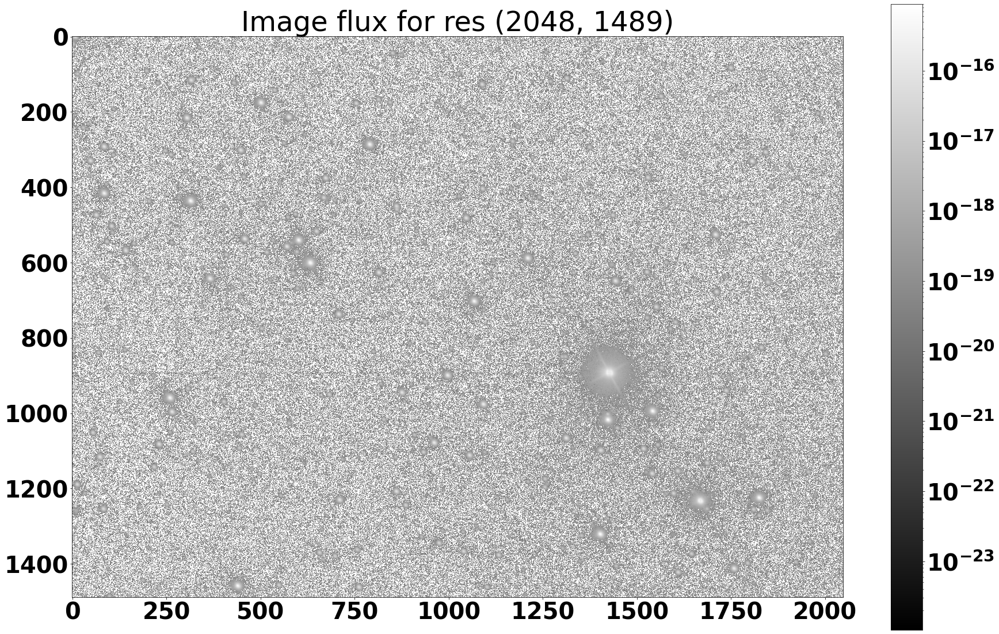

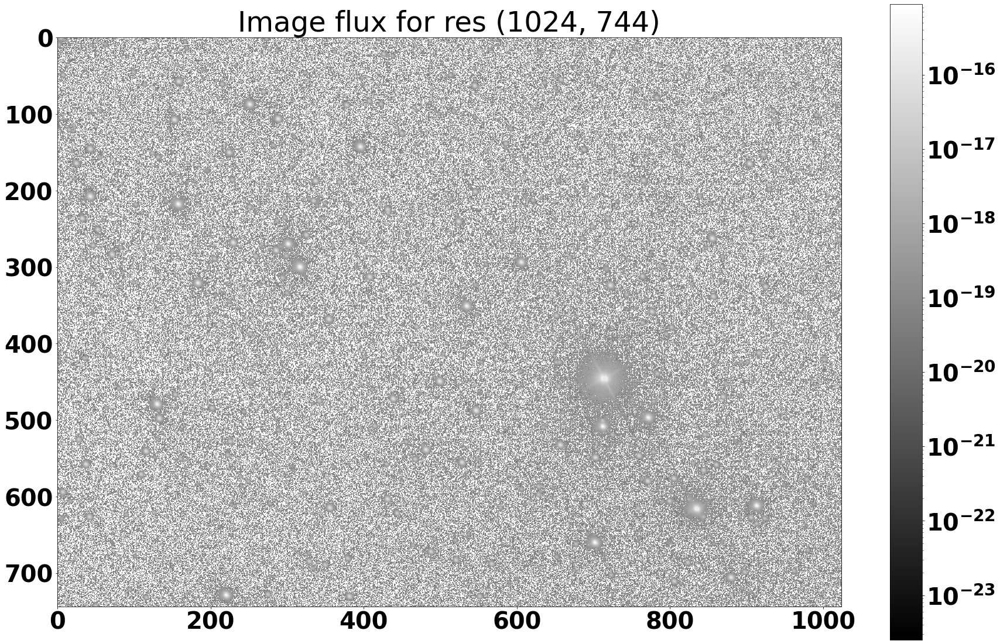

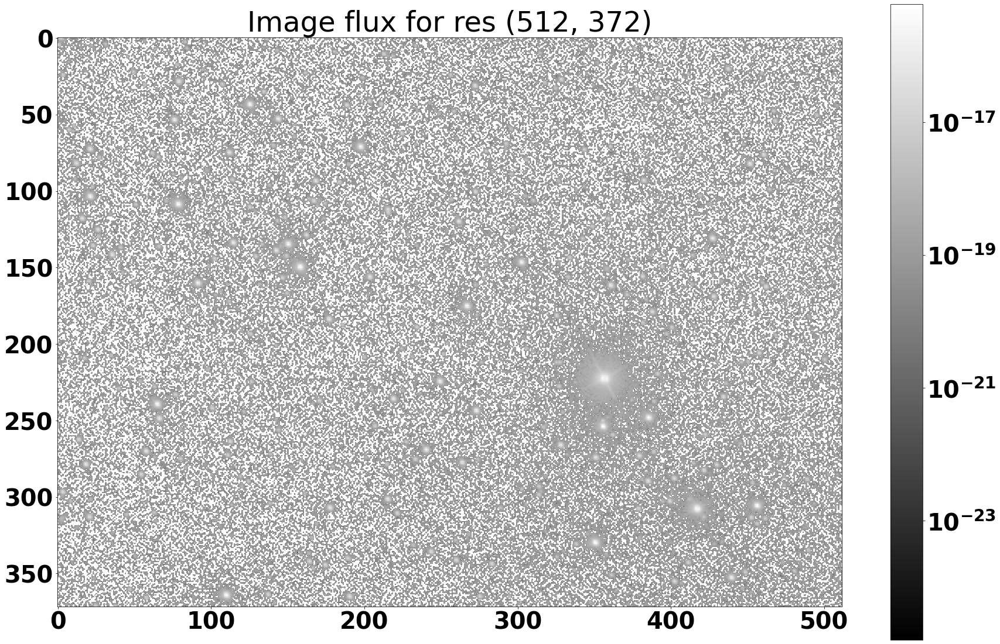

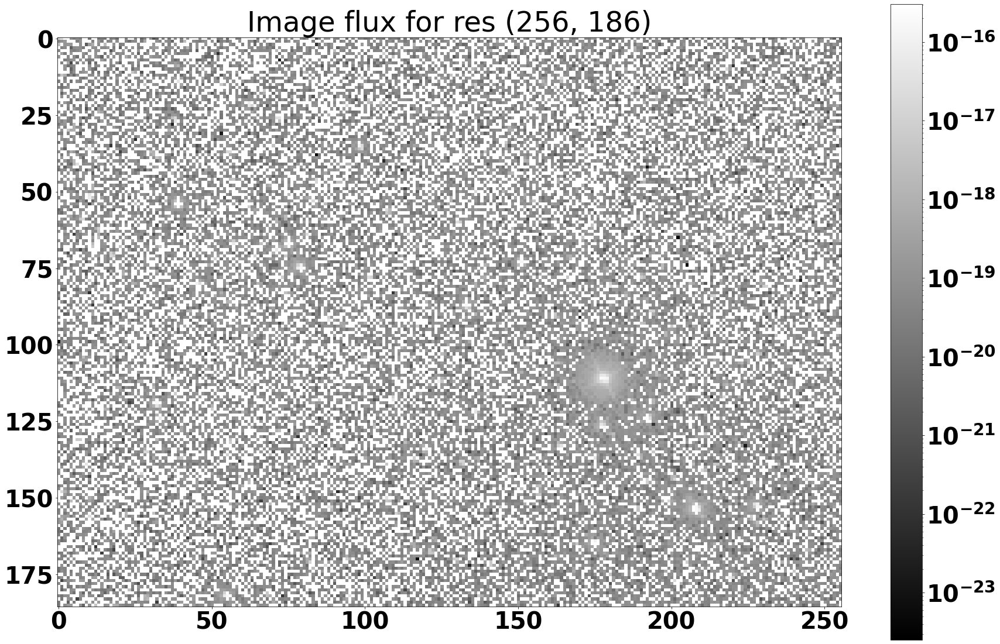

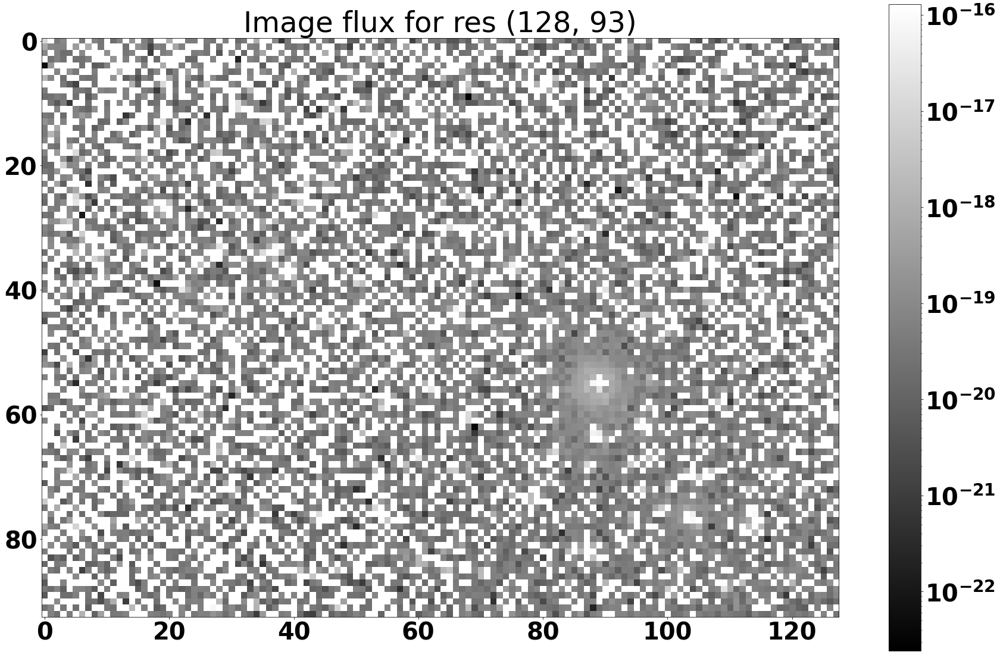

In [8]:
img_zoom_cnt = 4


def plot_image_cube(res_cube):
    for img in res_cube:
        plt.figure(figsize=(30,20))
        plt.imshow(img["flux_mean"], cmap='gray',  norm=LogNorm())
        plt.colorbar()
        plt.title("Image flux for res %s" %(str(img["zoom"])))
        #plt.figure(figsize=(30,20))
        #plt.imshow(img["flux_sigma"], cmap='gray')
        #plt.colorbar()
        #plt.title("Image variance for res %s" %(str(img["res"])))
       
        

fits_header, image_cube = photometry.get_multiple_resolution_image(test_image, img_zoom_cnt)

plot_image_cube(image_cube)



        
        
        

# Constructing database in HDF5 file
In this step we load the images and spectra, with their preprocessing applied above, into HDF5 file. Effectively we combine independently measured spectra and images into one sparse spectral cube that contains all the datapoints with comparable values.

Steps involved:
1. Create indexing structure to enable spatial, temporal, spectral and resolution-wise searching of the datasets.
2. Preprocess the images and spectra to construct lower resolutions and uncertainties.

In [9]:
import warnings
from astropy.utils.exceptions import AstropyWarning

h5_output_path = "../data/processed/galaxy_small.h5"
input_folder = "../data/raw/galaxy_small"

warnings.simplefilter('ignore', category=AstropyWarning)
command = "python %s/hisscube.py %s %s create" % (module_path, input_folder, h5_output_path)
print("Running command: %s" % command)
!mpiexec $command

Running command: python /home/caucau/SDSSCube/hisscube.py ../data/raw/galaxy_small ../data/processed/galaxy_small.h5 create
INFO:rank[0]:Rank 0 pid: 110500
INFO:rank[0]:Writing fits header cache.
INFO:rank[0]:Fits cnt: 00100
INFO:rank[0]:Creating image metadata in memory.
INFO:rank[0]:Image cnt: 00100
INFO:rank[0]:Creating spectra metadata in memory.
INFO:rank[0]:Initiating C booster for metadata write.
Creating the csv logging file: logs/c_timings.csv
Writing HDF5 file ../data/processed/galaxy_small.h5.
100%|██████████| 93/93 [01:04<00:00,  1.44it/s]
INFO:rank[0]:Rank 00: Terminating worker: 1
INFO:rank[0]:Rank 00: Terminating worker: 2
INFO:rank[0]:Rank 00: Terminating worker: 3
INFO:rank[0]:Rank 00: Terminating worker: 4
INFO:rank[0]:Rank 00: Terminating worker: 5
INFO:rank[0]:Rank 00: Terminating worker: 6
INFO:rank[0]:Rank 00: Terminating worker: 7
INFO:rank[0]:Rank 00: Terminating worker: 8
INFO:rank[0]:Rank 00: Terminating worker: 9
INFO:rank[0]:Rank 00: Terminating worker: 10
I

In [10]:
from hisscube.utils.io import SerialH5Reader
from hisscube.utils.config import Config
from hisscube.processors.cube_visualization import VisualizationProcessor
from astropy.samp import SAMPIntegratedClient
from urllib.parse import urljoin
import os


config = Config()
h5_serial_reader = SerialH5Reader(h5_output_path, config)
processor = VisualizationProcessor(config)
output_path = "../results/output.fits"

with h5_serial_reader as h5_connector:
    processor.h5_connector = h5_connector
    processor.construct_spectral_cube_table(zoom=0)
    processor.write_FITS(output_path)

client = SAMPIntegratedClient()
client.connect()

params = {}
params["url"] = urljoin('file:', os.path.abspath(output_path))
params["name"] = "SDSS Cube"
print(params["url"])

message = {}
message["samp.mtype"] = "table.load.fits"
message["samp.params"] = params

client.notify_all(message)

file:///home/caucau/SDSSCube/results/output.fits


['c1']

In [11]:
import pandas as pd

with h5_serial_reader as h5_connector:
    processor.h5_connector = h5_connector
    spectral_cube = processor.read_spectral_cube_table(zoom=0)
    pd_cube = pd.DataFrame.from_records(spectral_cube)
    res = pd_cube.groupby(['heal_id','ra', 'dec', 'wl']).mean()
    res2 = res.groupby(['heal_id', 'wl']).count().sort_values('time', ascending=False)
    print (res2)
    

                       time   mean  sigma  spec_ra  spec_dec
heal_id       wl                                            
1557517971485 7480.0  77825  77825  77825    77825     77825
1557517973610 7480.0  73729  73729  73729    73729     73729
1557517971485 3551.0  73728  73728  73728    73728     73728
              4686.0  73728  73728  73728    73728     73728
1557517973610 6166.0  73728  73728  73728    73728     73728
...                     ...    ...    ...      ...       ...
1557517971485 6936.0      1      1      1        1         1
              6928.0      1      1      1        1         1
              6920.0      1      1      1        1         1
              6912.0      1      1      1        1         1
1557517973610 3852.0      1      1      1        1         1

[1252 rows x 5 columns]


In [12]:
import healpy as hp
spectra_folder = "%s/spectra" % input_folder

ra=[]
dec = []
spectra_paths = list(Path(spectra_folder).rglob(test_spectra))
print(len(spectra_paths))
for spectrum in spectra_paths:
    hdul = fitsio.read_header(spectrum)
    ra.append(hdul["PLUG_RA"])
    dec.append(hdul["PLUG_DEC"])
    
names =  hp.ang2pix(hp.order2nside(19),
                         ra, dec,
                         nest=True,
                         lonlat=True)
print(sorted(names))
print(set(names))

11
[1557517971485, 1557517971485, 1557517971485, 1557517971485, 1557517971485, 1557517971485, 1557517971485, 1557517971485, 1557517973610, 1557517973610, 1557517973610]
{1557517973610, 1557517971485}
